<a href="https://colab.research.google.com/github/shaysakazi/Gender-bias-in-tv-series/blob/main/Gender_bias_in_tv_series.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# We choose to analyze gender bias in tv series, we choose **Simpsons, Family Guy, Rick & Morty, and South Park** dialogs to detect and outlies any gender bias in the series. For each section, we used a specific method and then analyzed each of the different datasets.

# Preprocess datasets

In this section, we extract the relevant data sets from Kaggle. We analyze the gender differences between the following tv series: Simpsons, Family Guy, Rick & Morty, and South Park.

## Installations of libraries

In [ ]:
!pip install turicreate
!pip install spaCy
!pip install pymongo
!pip install geopandas
!pip install descartes
!pip install geopy
!pip install folium
!pip install imageio
!pip install plotly_express
!pip install kaggle 
!pip install -U plotly
!pip install bar_chart_race
!pip install textblob
!pip install afinn
!pip install vaderSentiment

!mkdir models
!wget -O ./models/GoogleNews-vectors-negative300.bin.gz https://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz
!gunzip ./models/GoogleNews-vectors-negative300.bin.gz

Requirement already up-to-date: plotly in /usr/local/lib/python3.7/dist-packages (4.14.3)
mkdir: cannot create directory ‘models’: File exists
--2021-02-27 16:36:52--  https://s3.amazonaws.com/dl4j-distribution/GoogleNews-vectors-negative300.bin.gz
Resolving s3.amazonaws.com (s3.amazonaws.com)... 52.217.82.62
Connecting to s3.amazonaws.com (s3.amazonaws.com)|52.217.82.62|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1647046227 (1.5G) [application/x-gzip]
Saving to: ‘./models/GoogleNews-vectors-negative300.bin.gz’

./models/GoogleNews 100%[===================>]   1.53G  46.4MB/s    in 34s     

2021-02-27 16:37:27 (45.8 MB/s) - ‘./models/GoogleNews-vectors-negative300.bin.gz’ saved [1647046227/1647046227]

gzip: ./models/GoogleNews-vectors-negative300.bin already exists; do you wish to overwrite (y or n)? n
	not overwritten


In [ ]:
import re 
import numpy as np
import pandas as pd
import networkx as nx
import plotly_express as px
import json
from urllib.request import urlopen
import os
from textblob import TextBlob
from afinn import Afinn
import nltk
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import bar_chart_race as bcr
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer 
from gensim.models import Word2Vec
from sklearn.manifold import TSNE
import turicreate as tc
import gensim
from sklearn.model_selection import train_test_split
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
from tqdm import tqdm_notebook as tqdm
from pprint import pprint

nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

STOP_WORDS = stopwords.words()
STOP_WORDS.remove('she')
STOP_WORDS.remove('he')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
!mkdir /root/.kaggle/

# Installing the Kaggle package
!pip install --upgrade --force-reinstall --no-deps kaggle

#Important Note: complete this with your own key - after running this for the first time remmember to **remove** your API_KEY
api_token = {"username":"","key":""}

# creating kaggle.json file with the personal API-Key details 
# You can also put this file on your Google Drive
with open('/root/.kaggle/kaggle.json', 'w') as file:
  json.dump(api_token, file)
!chmod 600 /root/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle/’: File exists
Processing /root/.cache/pip/wheels/3a/d1/7e/6ce09b72b770149802c653a02783821629146983ee5a360f10/kaggle-1.5.10-cp37-none-any.whl
  Found existing installation: kaggle 1.5.10
    Uninstalling kaggle-1.5.10:
      Successfully uninstalled kaggle-1.5.10


## Simpsons dataset
Contains the characters, locations, episode details, and script lines for approximately 600 Simpsons episodes.

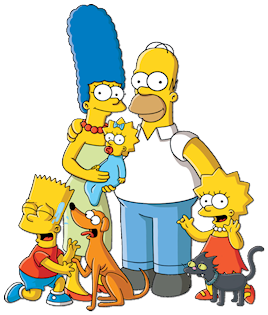

In [ ]:
!kaggle datasets download prashant111/the-simpsons-dataset -p ./datasets/simpsons
!unzip ./datasets/simpsons/*.zip  -d ./datasets/simpsons
!rm -r ./datasets/simpsons/the-simpsons-dataset.zip

  0% 0.00/8.70M [00:00<?, ?B/s]
100% 8.70M/8.70M [00:00<00:00, 156MB/s]
Archive:  ./datasets/simpsons/the-simpsons-dataset.zip
replace ./datasets/simpsons/datapackage.json? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [ ]:
simpsons_episode_df = pd.read_csv('./datasets/simpsons/simpsons_episodes.csv')
simpsons_episode_df = simpsons_episode_df[['id', 'season']]

simpsons_character_df = pd.read_csv('./datasets/simpsons/simpsons_characters.csv')
simpsons_script_df = pd.read_csv('./datasets/simpsons/simpsons_script_lines.csv')
simpsons_script_df = simpsons_script_df[simpsons_script_df['speaking_line'] == True]
simpsons_script_df['character_id'] = pd.to_numeric(simpsons_script_df['character_id'].apply(lambda s: int(s) if str(s).isnumeric() or str(s).replace('.','',1).isnumeric() else 0))
simpsons_script_df = pd.merge(simpsons_script_df, simpsons_character_df, how='left', left_on='character_id', right_on='id')

simpsons_script_df = simpsons_script_df[['episode_id', 'number', 'raw_character_text', 'spoken_words', 'gender']]
simpsons_script_df['raw_character_text'] = simpsons_script_df['raw_character_text'].apply(lambda x: x.lower() if type(x)==str else '')
simpsons_script_df['spoken_words'] = simpsons_script_df['spoken_words'].apply(lambda x: re.sub(r'[^\w\s]','',x.lower()) if type(x)==str else '')

simpsons_df = pd.merge(simpsons_episode_df, simpsons_script_df, how='inner', left_on='id', right_on='episode_id')
simpsons_df = simpsons_df[['raw_character_text', 'spoken_words', 'season', 'gender']]
simpsons_df = simpsons_df.rename(columns={"raw_character_text": "character", "spoken_words": "dialog", 'season': 'seasons'})
simpsons_df = simpsons_df.dropna()
simpsons_df = simpsons_df.sort_values('seasons').reset_index(drop=True)

print(simpsons_df.shape)
simpsons_df.head()

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (4,5,6) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


(92703, 4)


,character,dialog,seasons,gender
0,miss hoover,no actually it was a little of both sometimes ...,2,f
1,marge simpson,but the big day finally came and because id wo...,2,f
2,mrs. glick,here we are,2,f
3,nelson muntz,haw haw,2,m
4,marge simpson,for months i worked and worked while my sister...,2,f


## Family guy dataset
This dataset consists of dialogue from the family guy series

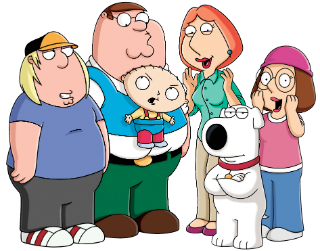

In [ ]:
!kaggle datasets download gokulrajkmv/family-guy-dialog -p ./datasets/family_guy_dialog
!unzip ./datasets/family_guy_dialog/*.zip  -d ./datasets/family_guy_dialog
!rm -r ./datasets/family_guy_dialog/family-guy-dialog.zip

  0% 0.00/42.2k [00:00<?, ?B/s]
100% 42.2k/42.2k [00:00<00:00, 35.7MB/s]
Archive:  ./datasets/family_guy_dialog/family-guy-dialog.zip
replace ./datasets/family_guy_dialog/Family_guy_dialog.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [ ]:
family_guy_df = pd.read_csv('./datasets/family_guy_dialog/Family_guy_dialog.csv')
family_guy_df = family_guy_df.fillna('')

family_guy_df['character'] = family_guy_df['character'].apply(lambda x: x.lower())
family_guy_df = family_guy_df[family_guy_df['character'] != 'maids and butlers m&b']
family_guy_df['seasons'] = family_guy_df['seasons'].apply(lambda x: int(x.split(' ')[1]))
family_guy_df['dialog'] = family_guy_df['dialog'].apply(lambda x: re.sub(r'[^\w\s]','',x.lower()) if type(x)==str else '')
family_guy_df['gender'] = family_guy_df['character'].apply(lambda x: {'stewie': 'm', 'lois': 'f', 'peter': 'm', 'brian': 'm', 'meg':'f', 'chris': 'm', 'quagmire': 'm', 'cleveland':'m'}[x])
family_guy_df.dropna()
family_guy_df = family_guy_df.sort_values('seasons').reset_index(drop=True)

print(family_guy_df.shape)
family_guy_df.head()

(1374, 4)


,character,dialog,seasons,gender
0,stewie,damn you vile woman youve impeded my work sin...,1,m
1,peter,i cant even watch tv anymore all the shows ar...,1,m
2,brian,gosh id like to help you peter but uh ive got...,1,m
3,meg,so do you like music,1,f
4,meg,uh you first,1,f


## Rick & Morty dataset
This dataset consists of dialogue from the Rick and Morty series

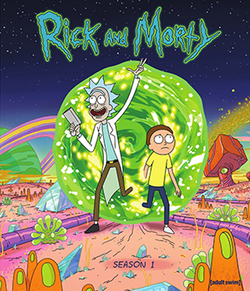

In [ ]:
!kaggle datasets download andradaolteanu/rickmorty-scripts -p ./datasets/rickmorty
!unzip ./datasets/rickmorty/*.zip  -d ./datasets/rickmorty
!rm -r ./datasets/rickmorty/rickmorty-scripts.zip

  0% 0.00/66.2k [00:00<?, ?B/s]
100% 66.2k/66.2k [00:00<00:00, 49.8MB/s]
Archive:  ./datasets/rickmorty/rickmorty-scripts.zip
replace ./datasets/rickmorty/RickAndMortyScripts.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [ ]:
rickmorty_df = pd.read_csv('./datasets/rickmorty/RickAndMortyScripts.csv')
rickmorty_df = rickmorty_df.rename(columns={'name': 'character', 'season no.': "seasons", 'line': 'dialog'})
rickmorty_df = rickmorty_df[['character', 'dialog', 'seasons']]

rickmorty_duplicate_dict = {'pickle rick': 'rick', 'cop morty': 'morty', 'all ricks': 'rick', 'cop rick': 'rick', 'drunk rick': 'rick', 'candidate morty': 'morty', 'all mortys': 'morty', 'morty 2': 'morty', 'all summers': 'summer', 'campaign manager morty': 'morty', 'lizard morty': 'morty',  'rick j-22': 'rick', 'young rick': 'rick', 'glasses morty': 'morty', 'teacher rick': 'rick', 'morty 1': 'morty', 'summer 1': 'summer', 'riq iv': 'rick', 'slick': 'morty'}
rickmorty_df['character'] = rickmorty_df['character'].apply(lambda x: x.lower())
rickmorty_df['character'] = rickmorty_df['character'].apply(lambda x: x if x not in rickmorty_duplicate_dict.keys() else rickmorty_duplicate_dict[x])
rickmorty_df['dialog'] = rickmorty_df['dialog'].apply(lambda x: re.sub(r'[^\w\s]','',x.lower()) if type(x)==str else '')
rickmorty_gender_dict = {'rick': 'm', 'morty': 'm', 'beth': 'f', 'jerry': 'm', 'summer': 'f', 'supernova': 'f', 'mr. goldenfold': 'm', 'president': 'm', 'testicle monster a': 'm', 'principal vagina': 'm', 'cornvelious daniel': 'm', 'snuffles': 'm', 'dr. wong': 'f', 'agency director': 'm', 'alan': 'm', 'vance': 'm', 'scary terry': 'm', 'jessica': 'f', 'million ants': 'm', 'ice-t': 'm', 'alien doctor': 'm', 'nathan': 'm', 'cromulon': 'm', 'brad': 'm', 'birdperson': 'm', 'vet': 'f', 'narrator': 'm', 'announcer': 'm', 'mrs. pancakes': 'f'}
rickmorty_df['gender'] = rickmorty_df['character'].apply(lambda x: rickmorty_gender_dict[x])
rickmorty_df = rickmorty_df.sort_values('seasons').reset_index(drop=True)

print(rickmorty_df.shape)
rickmorty_df.head()

(1905, 4)


,character,dialog,seasons,gender
0,rick,morty you gotta come on jus you gotta come wit...,1,m
1,snuffles,where are my testicles summer where are my te...,1,m
2,rick,holy crap morty he can travel through dreams h...,1,m
3,morty,ohhhh,1,m
4,scary terry,nothing but fear from here on out bitch,1,m


## South Park dataset
South Park cartoon lines

+70k lines, annotated with season, episode and speaker

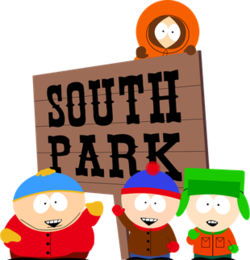

In [ ]:
!kaggle datasets download tovarischsukhov/southparklines -p ./datasets/southpark
!unzip ./datasets/southpark/*.zip  -d ./datasets/southpark
!rm -r ./datasets/southpark/southparklines.zip

  0% 0.00/1.81M [00:00<?, ?B/s]
100% 1.81M/1.81M [00:00<00:00, 193MB/s]
Archive:  ./datasets/southpark/southparklines.zip
replace ./datasets/southpark/All-seasons.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [ ]:
southpark_df = pd.read_csv('./datasets/southpark/All-seasons.csv')
southpark_df = southpark_df.rename(columns={'Character': 'character', 'Season': "seasons", 'Line': 'dialog'})
southpark_df = southpark_df[['character', 'dialog', 'seasons']]

southpark_df['character'] = southpark_df['character'].apply(lambda x: x.lower())
southpark_df['dialog'] = southpark_df['dialog'].apply(lambda x: re.sub(r'[^\w\s]','',x.lower().strip("', /\n")) if type(x)==str else '')
southpark_gender_dict = {'cartman': 'm', 'stan': 'm', 'kyle': 'm', 'butters': 'm', 'randy': 'm', 'mr. garrison': 'm', 'chef': 'm', 'kenny': 'm', 'sharon': 'f', 'mr. mackey': 'm', 'gerald': 'm', 'jimmy': 'm', 'wendy': 'f', 'liane': 'f', 'sheila': 'f', 'jimbo': 'm', 'announcer': 'm', 'stephen': 'm', 'craig': 'm', 'clyde': 'm', 'jesus': 'm', 'linda': 'f', 'principal victoria': 'f', 'terrance': 'm', 'mrs. garrison': 'f', 'token': 'm', 'timmy': 'm', 'mayor': 'f', 'tweek': 'm', 'phillip': 'm'}
southpark_df = southpark_df[southpark_df['character'].isin(southpark_gender_dict.keys())]
southpark_df['gender'] = southpark_df['character'].apply(lambda x: southpark_gender_dict[x])
southpark_df['seasons'] = pd.to_numeric(southpark_df['seasons'])
southpark_df = southpark_df.sort_values('seasons').reset_index(drop=True)
print(southpark_df.shape)
southpark_df.head()

(41532, 4)


,character,dialog,seasons,gender
0,jimbo,get around th side there ned i cant get a shot...,1,m
1,mr. garrison,rats,1,m
2,gerald,it is sick and disgusting and we simply will n...,1,m
3,sheila,your fathers right kyle,1,f
4,gerald,sheila let me handle this having imaginary fr...,1,m


# Screenplay dialog broken-down by gender per season


## In this section, we will visualize the dialogues in each series break-down by gender. We hypothesize that male characters will take the major of the conversations in each series.

### Section author: @Shay

In [ ]:
def visualize_dialog_per_gender(df, title):
  """
    This function visualize the dialogues of each series break-down by genedr
    :param df: series dataframe
    :param title: series name
  """
  df_gb = df.groupby(['seasons', 'gender']).size().reset_index(name='counts')
  
  for s in df['seasons'].unique():
    s_count = df_gb[df_gb['seasons'] == s].counts.sum()
    df_gb.loc[(df_gb['seasons'] == s) & (df_gb['gender'] == 'm'), 'counts'] = df_gb.loc[(df_gb['seasons'] == s) & (df_gb['gender'] == 'm')].counts / s_count
    df_gb.loc[(df_gb['seasons'] == s) & (df_gb['gender'] == 'f'), 'counts'] = df_gb.loc[(df_gb['seasons'] == s) & (df_gb['gender'] == 'f')].counts / s_count
  df_gb = df_gb.sort_values('gender', ascending=False)

  fig = px.bar(df_gb, x="counts", y="seasons", color="gender", orientation="h", title=f"{title} screenplay dialog broken-down by gender per season")
  fig.show()

## Simpsons

In [ ]:
visualize_dialog_per_gender(simpsons_df.copy(), 'Simpsons')

## Family guy

In [ ]:
visualize_dialog_per_gender(family_guy_df.copy(), 'Family guy')

## Rick & Morty

In [ ]:
visualize_dialog_per_gender(rickmorty_df.copy(), 'Rick & Morty')

## South Park

In [ ]:
visualize_dialog_per_gender(southpark_df.copy(), 'South Park')

## Conclusion

### As we can see from the plots in each series, there is a male dialog dominance as we hypothesize for every season. The maximum male dialogues were observed at Family Guy season 7 with 97% male and 3% female dialogues. The minimum male dialogue was observed also in Family Guy at season 2 with 64% male and 36% female dialogues.

# The character who spoke the most  

## In this section, we will visualize the dialogues in each series by character per season. We hypothesize that male characters will take first place in each series.

### Section author: @Ido

In [ ]:
def get_piv_by_season(df):
  """
    This function create a piv dataframe calculating the dialogues for each character
    :param df: series dataframe
    :return: series piv dataframe 
  """
  top_characters = df.character.value_counts()[:8].index.tolist()
  df = df[df['character'].isin(top_characters)].reset_index(drop=True)
  df_gb = df.groupby(['character','seasons']).size().reset_index(name='counts')

  df_gb_len = len(df_gb)
  for c in top_characters:
    for s in df.seasons.unique():
      if len(df_gb[(df_gb['character'] == c) & (df_gb['seasons'] == s)].index) == 0:
        df_gb.loc[df_gb_len] = [c, s, 0]
        df_gb_len +=1
  
  df_piv = df_gb.pivot(index='seasons', columns='character', values='counts')
  return df_piv.cumsum()

## Simpsons

In [ ]:
bcr.bar_chart_race(get_piv_by_season(simpsons_df.copy()), title='Simpsons', steps_per_period=100)

## Family guy

In [ ]:
bcr.bar_chart_race(get_piv_by_season(family_guy_df.copy()), title='Family guy', steps_per_period=100, period_length=1000)

## Rick & Morty

In [ ]:
bcr.bar_chart_race(get_piv_by_season(rickmorty_df.copy()), title='Rick & Morty', steps_per_period=100, period_length=1000)

## South Park

In [ ]:
bcr.bar_chart_race(get_piv_by_season(southpark_df.copy()), title='South Park', steps_per_period=100)

## Conclusion

### As we can see from the bar chart race in each series, every top character is a male, and the female characters are "settles" with 3rd or 4th place. We also find that there are at most two females in the main characters of ten or eight most spoke characters in every series.

# Sentiment analysis

## In this section, we will visualize the sentiment dialogues in each series by character. We hypothesize that male characters will be more aggressive or talk dirtier while female characters will speak with more delicacy.

### Section author: @Ido

In [ ]:
def extract_sentiment_dialogs(df):
  """
    This function extract the sentiment of each dialogs
    :param df: series dataframe
    :return: the group-by data frame for each character its sentiment dialogs
  """
  top_characters = df.character.value_counts()[:10].index.tolist()
  df = df[df['character'].isin(top_characters)].reset_index(drop=True)

  df['sentiment'] = df['dialog'].apply(lambda txt: (TextBlob(txt).sentiment.polarity + Afinn().score(txt)) / 2)
  df['sentiment'] = df['sentiment'].apply(lambda s: 'positive' if s>0.4 else ('negative' if s<-0.4 else 'neutral'))
  df = df[df['sentiment'] != 'neutral']
  df_gb = df.groupby(['character', 'sentiment', 'gender']).size().reset_index(name='counts')

  for c in top_characters:
    c_dialog_count = df_gb[df_gb['character'] == c].counts.sum()
    df_gb.loc[(df_gb['character'] == c) & (df_gb['sentiment'] == 'positive'), 'counts'] = df_gb.loc[(df_gb['character'] == c) & (df_gb['sentiment'] == 'positive')].counts / c_dialog_count
    df_gb.loc[(df_gb['character'] == c) & (df_gb['sentiment'] == 'negative'), 'counts'] = df_gb.loc[(df_gb['character'] == c) & (df_gb['sentiment'] == 'negative')].counts / c_dialog_count

  return df_gb

In [ ]:
def plot_sentiment_dialogs(df):
  """
    This function plot the sentiment dialogs of each character in a given series dataframe
    :param df: series dataframe
  """
  df = extract_sentiment_dialogs(df)
  top_characters = df.character.value_counts()[:10].index.tolist()

  fig = make_subplots(rows=2, cols=2)
  fig.add_trace(go.Bar(name='positive male', x=df[(df['sentiment']=='positive') & (df['gender']=='m')].character, y=df[(df['sentiment']=='positive') & (df['gender']=='m')].counts, marker_color='green'), row=1, col=1)
  fig.add_trace(go.Bar(name='positive female', x=df[(df['sentiment']=='positive') & (df['gender']=='f')].character, y=df[(df['sentiment']=='positive') & (df['gender']=='f')].counts, marker_color='lightgreen'), row=1, col=2)
  fig.add_trace(go.Bar(name='negative male', x=df[(df['sentiment']=='negative') & (df['gender']=='m')].character, y=df[(df['sentiment']=='negative') & (df['gender']=='m')].counts, marker_color='red'), row=2, col=1)
  fig.add_trace(go.Bar(name='negative female', x=df[(df['sentiment']=='negative') & (df['gender']=='f')].character, y=df[(df['sentiment']=='negative') & (df['gender']=='f')].counts, marker_color='indianred'), row=2, col=2)

  fig.update_layout(title_text="Positive & Negative dialogues per gender")
  fig.update_yaxes(range=[0,1])

  fig.show()

In [ ]:
def plot_word_cloud(df, character, sentiment):
  """
    This function plot word cloud of sentiment dialog of a given character
    :param df: series dataframe
    :param character: character to plot
    :param sentiment: sentiment to plot (positive or negative)
  """
  # print word with a given character
  wordcloud = WordCloud(height=2000, width=2000, background_color='black')
  
  df = df[df['character'] == character].reset_index(drop=True)
  df['sentiment'] = df['dialog'].apply(lambda txt: (TextBlob(txt).sentiment.polarity + Afinn().score(txt)) / 2)
  df['sentiment'] = df['sentiment'].apply(lambda s: 'positive' if s>0.4 else ('negative' if s<-0.4 else 'neutral'))
  df = df[df['sentiment'] == sentiment].reset_index(drop=True)

  character_words = [WordNetLemmatizer().lemmatize(word) for word in word_tokenize(' '.join(df['dialog'].tolist())) if word not in STOP_WORDS and word.isalpha()]
  character_sentiment_words = []
  analyser = SentimentIntensityAnalyzer()

  if sentiment == 'positive':
    character_sentiment_words = [word for word in character_words if analyser.polarity_scores(word)['pos'] > 0.3]
  else:
    character_sentiment_words = [word for word in character_words if analyser.polarity_scores(word)['neg'] > 0.3]

  wordcloud = wordcloud.generate(' '.join(character_sentiment_words))
  plt.figure(figsize = (10, 10), facecolor = None) 
  plt.imshow(wordcloud)
  plt.title(f"Most common words in {sentiment} {character} dialogs")
  plt.axis('off')
  plt.show()

## Simpsons

In [ ]:
plot_sentiment_dialogs(simpsons_df.copy())

### Hoomer

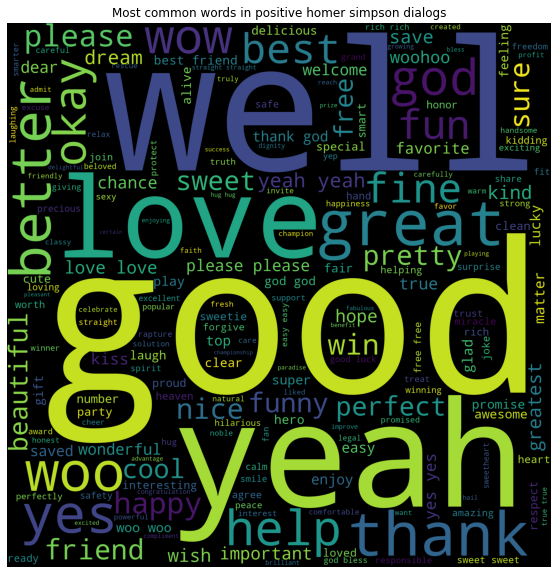

In [ ]:
plot_word_cloud(simpsons_df.copy(), 'homer simpson', 'positive')

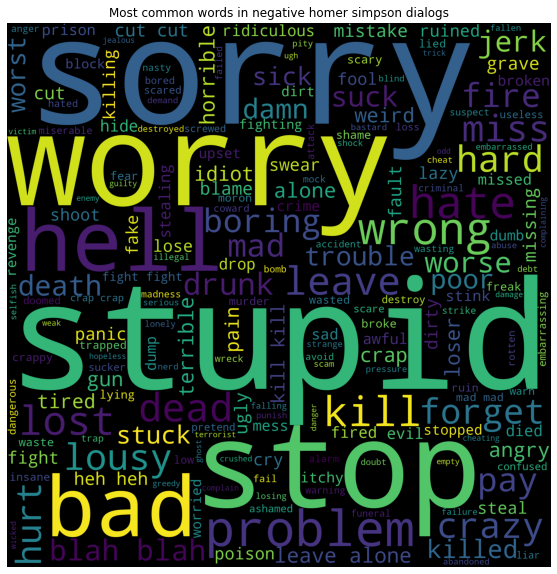

In [ ]:
plot_word_cloud(simpsons_df.copy(), 'homer simpson', 'negative')

### Marge

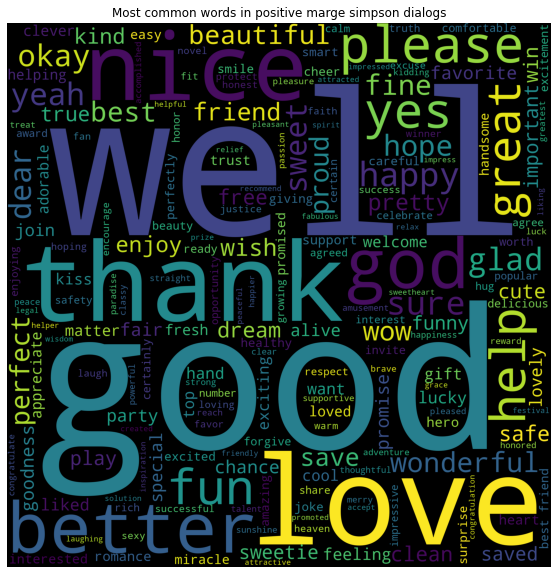

In [ ]:
plot_word_cloud(simpsons_df.copy(), 'marge simpson', 'positive')

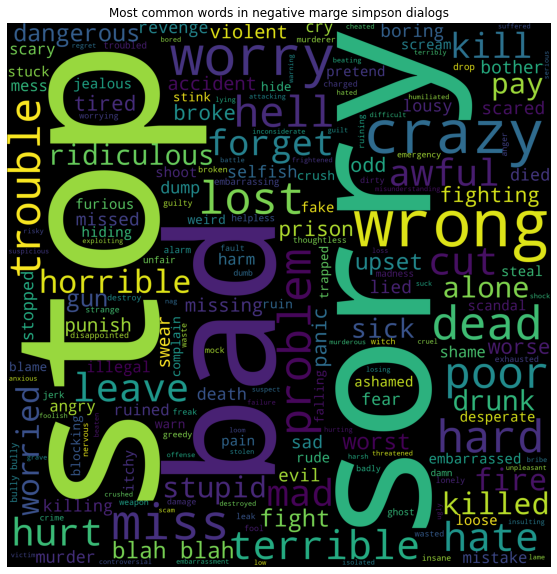

In [ ]:
plot_word_cloud(simpsons_df.copy(), 'marge simpson', 'negative')

### Bart

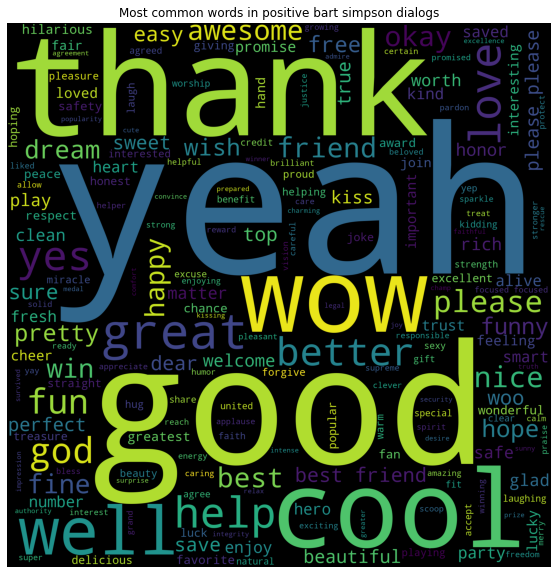

In [ ]:
plot_word_cloud(simpsons_df.copy(), 'bart simpson', 'positive')

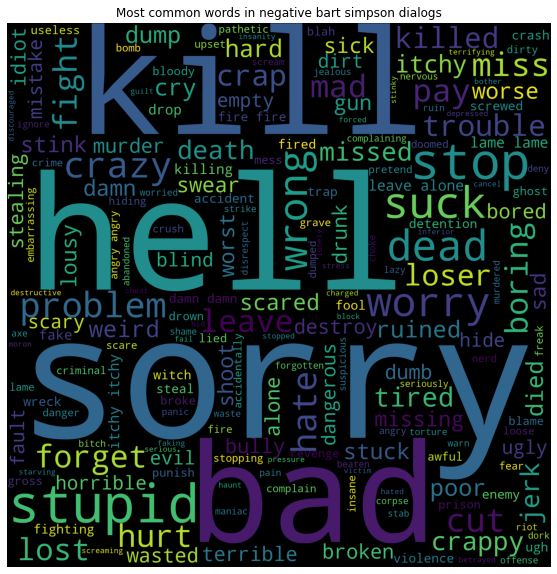

In [ ]:
plot_word_cloud(simpsons_df.copy(), 'bart simpson', 'negative')

### Lisa

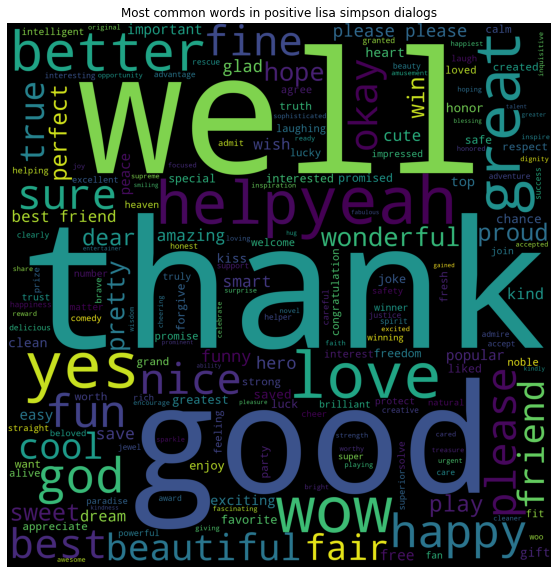

In [ ]:
plot_word_cloud(simpsons_df.copy(), 'lisa simpson', 'positive')

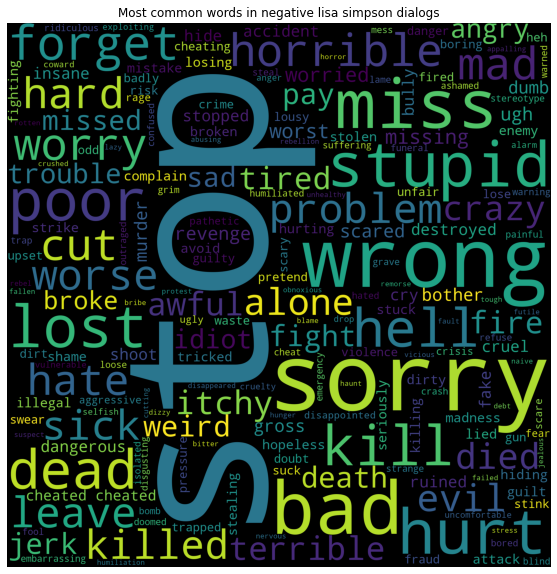

In [ ]:
plot_word_cloud(simpsons_df.copy(), 'lisa simpson', 'negative')

## Family guy

In [ ]:
plot_sentiment_dialogs(family_guy_df.copy())

### Peter

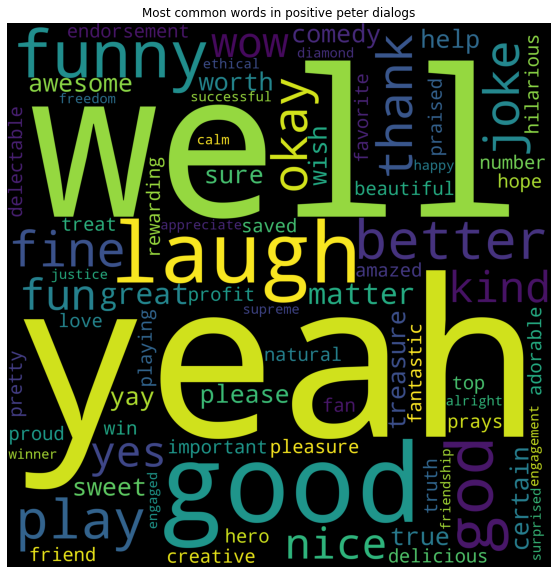

In [ ]:
plot_word_cloud(family_guy_df.copy(), 'peter', 'positive')

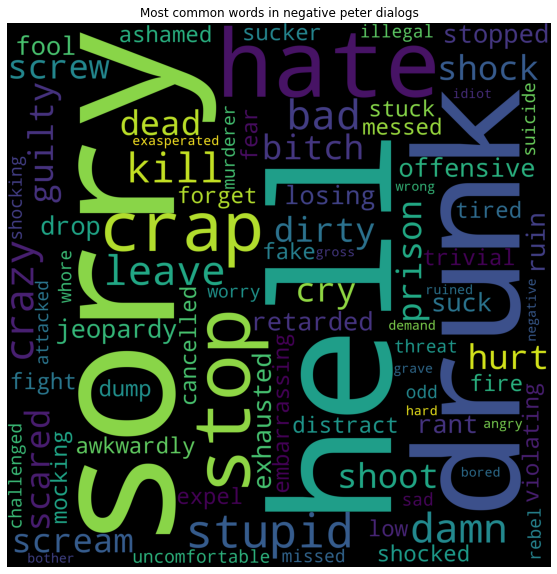

In [ ]:
plot_word_cloud(family_guy_df.copy(), 'peter', 'negative')

### Lois

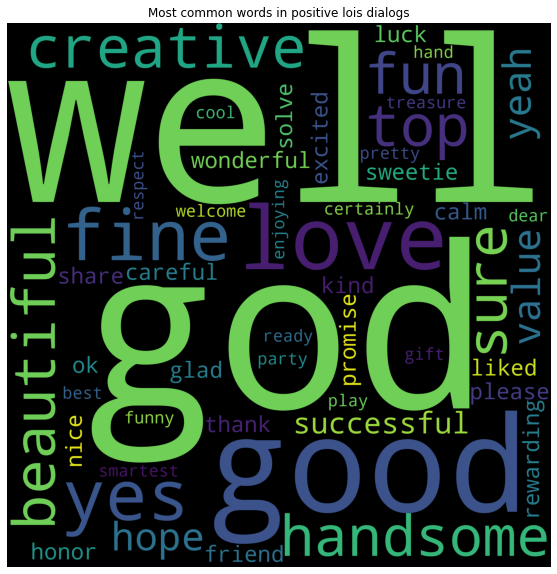

In [ ]:
plot_word_cloud(family_guy_df.copy(), 'lois', 'positive')

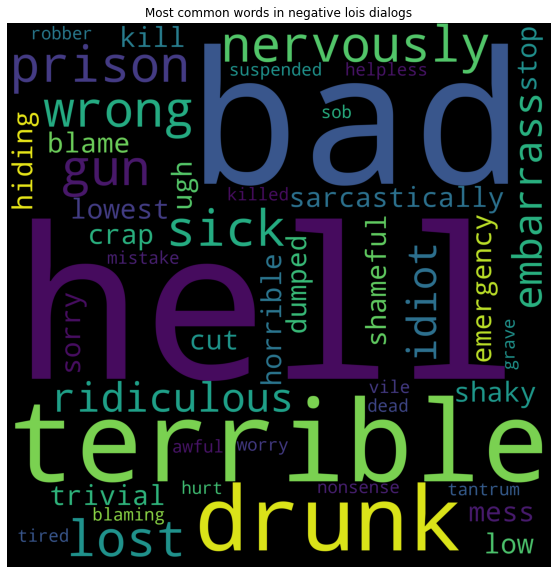

In [ ]:
plot_word_cloud(family_guy_df.copy(), 'lois', 'negative')

### Stewie

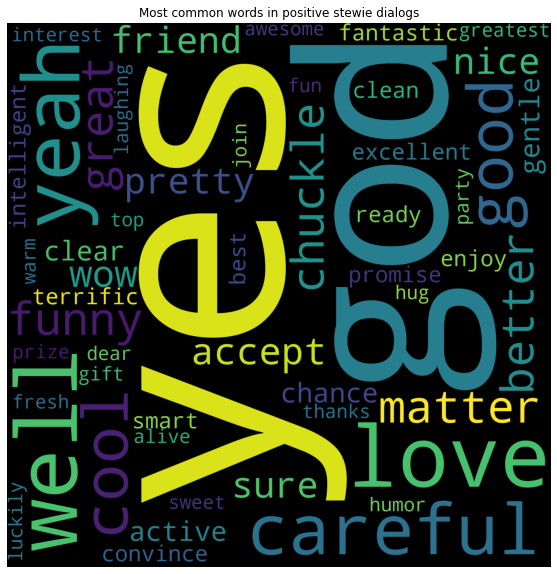

In [ ]:
plot_word_cloud(family_guy_df.copy(), 'stewie', 'positive')

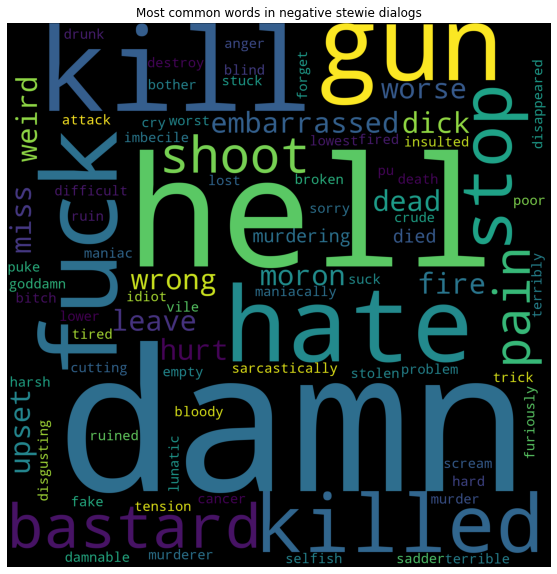

In [ ]:
plot_word_cloud(family_guy_df.copy(), 'stewie', 'negative')

### Meg

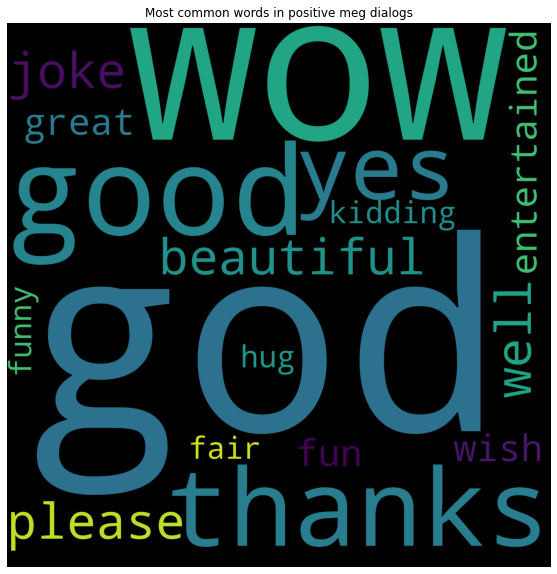

In [ ]:
plot_word_cloud(family_guy_df.copy(), 'meg', 'positive')

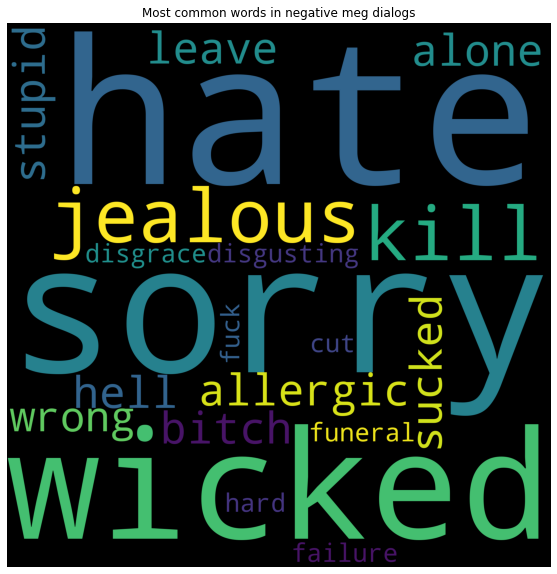

In [ ]:
plot_word_cloud(family_guy_df.copy(), 'meg', 'negative')

## Rick & Morty

In [ ]:
plot_sentiment_dialogs(rickmorty_df.copy())

### Rick

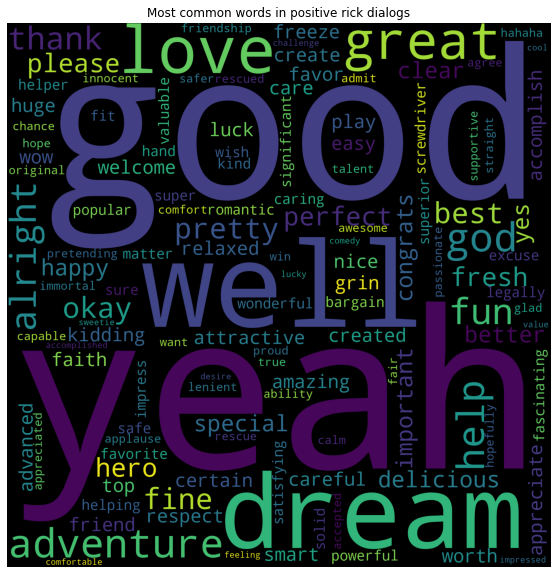

In [ ]:
plot_word_cloud(rickmorty_df.copy(), 'rick', 'positive')

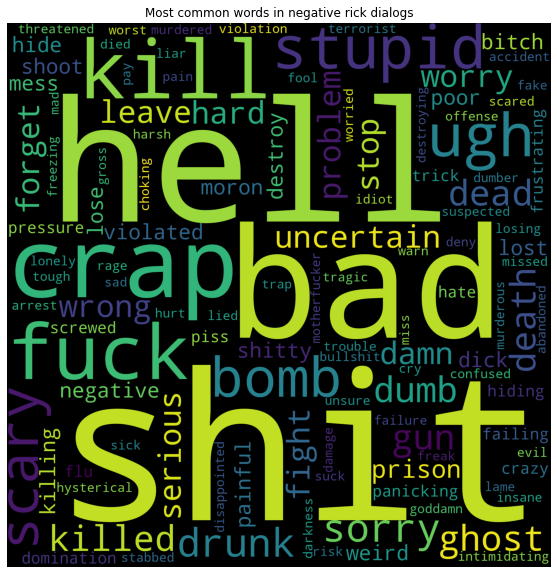

In [ ]:
plot_word_cloud(rickmorty_df.copy(), 'rick', 'negative')

### Beth

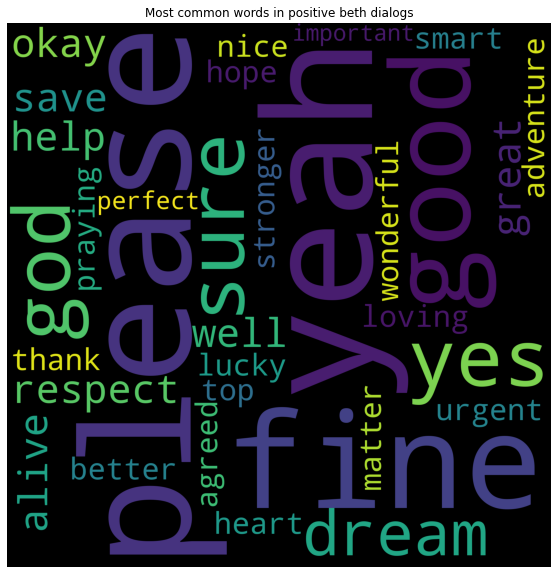

In [ ]:
plot_word_cloud(rickmorty_df.copy(), 'beth', 'positive')

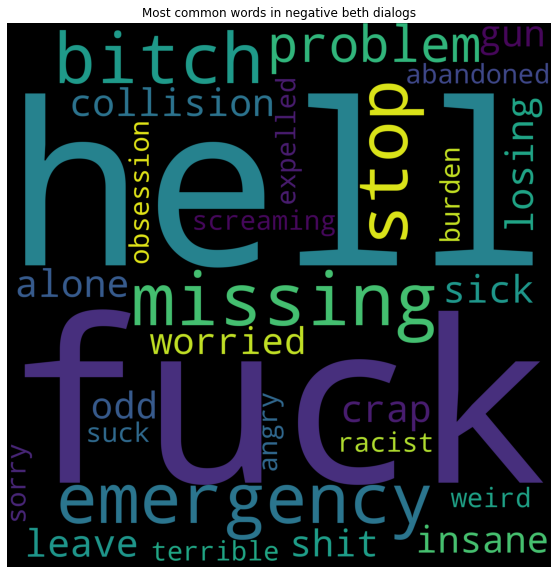

In [ ]:
plot_word_cloud(rickmorty_df.copy(), 'beth', 'negative')

### Morty

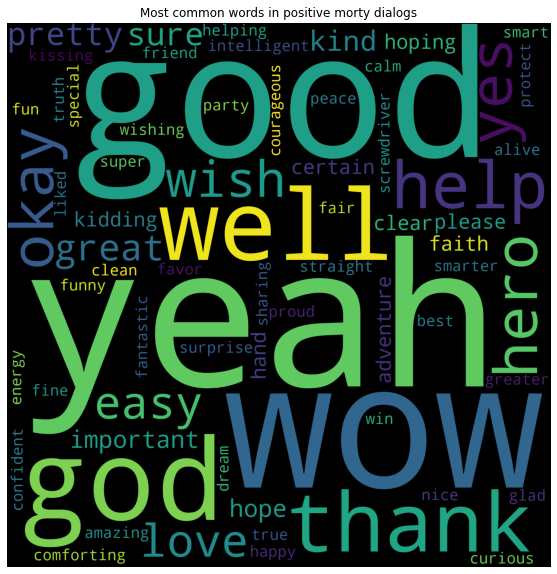

In [ ]:
plot_word_cloud(rickmorty_df.copy(), 'morty', 'positive')

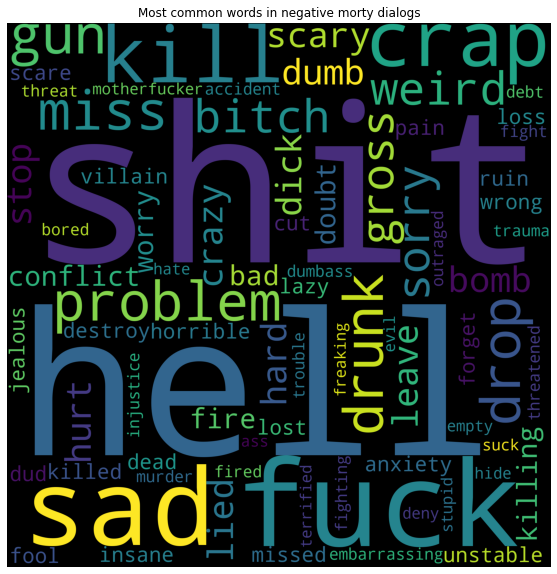

In [ ]:
plot_word_cloud(rickmorty_df.copy(), 'morty', 'negative')

### Summer

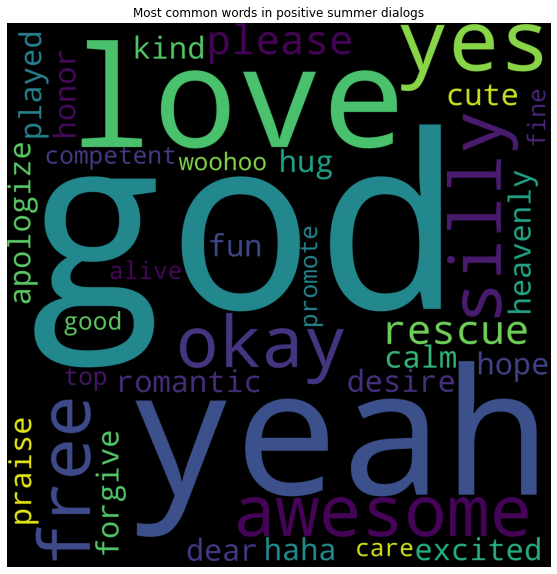

In [ ]:
plot_word_cloud(rickmorty_df.copy(), 'summer', 'positive')

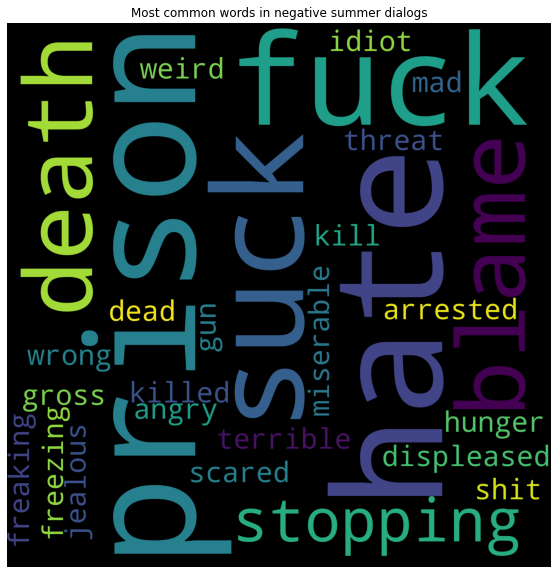

In [ ]:
plot_word_cloud(rickmorty_df.copy(), 'summer', 'negative')

## South Park

In [ ]:
plot_sentiment_dialogs(southpark_df.copy())

### Randy

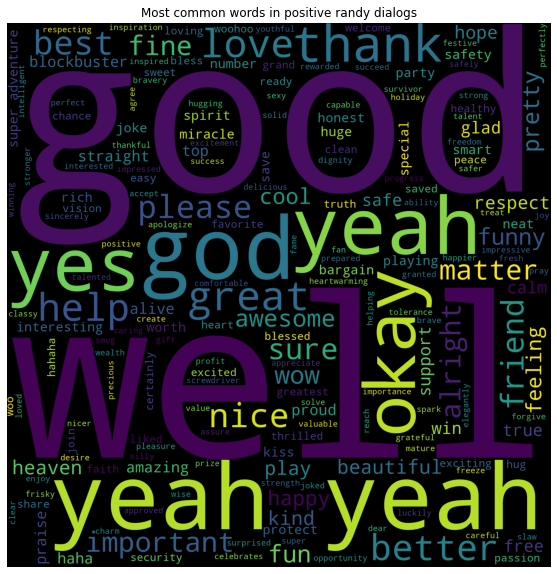

In [ ]:
plot_word_cloud(southpark_df.copy(), 'randy', 'positive')

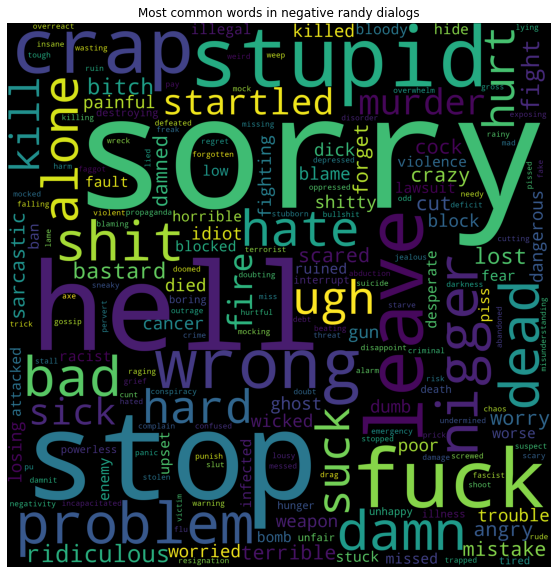

In [ ]:
plot_word_cloud(southpark_df.copy(), 'randy', 'negative')

### Sharon

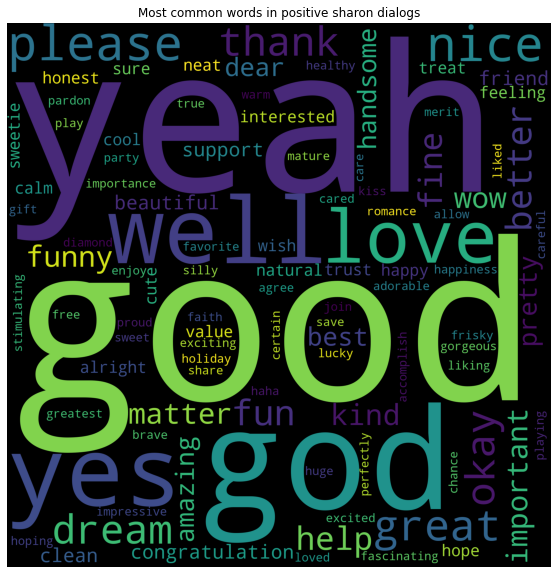

In [ ]:
plot_word_cloud(southpark_df.copy(), 'sharon', 'positive')

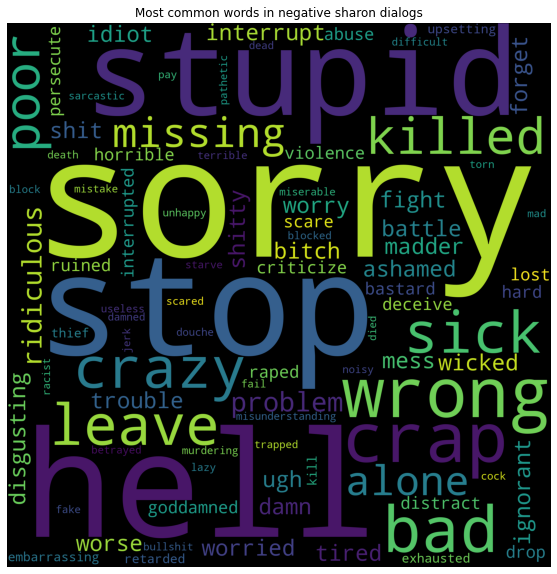

In [ ]:
plot_word_cloud(southpark_df.copy(), 'sharon', 'negative')

### Gerald

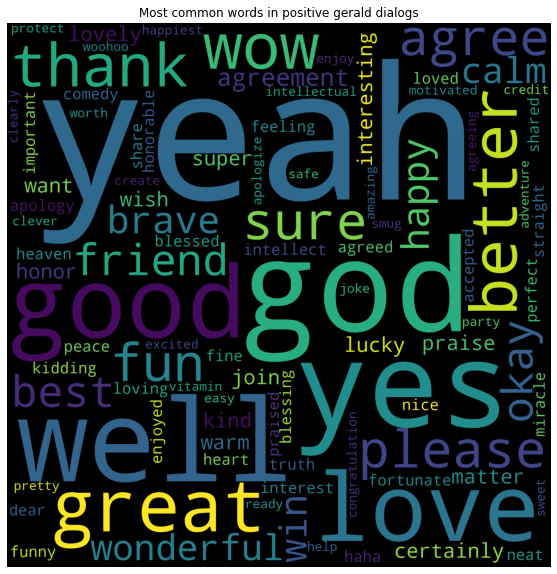

In [ ]:
plot_word_cloud(southpark_df.copy(), 'gerald', 'positive')

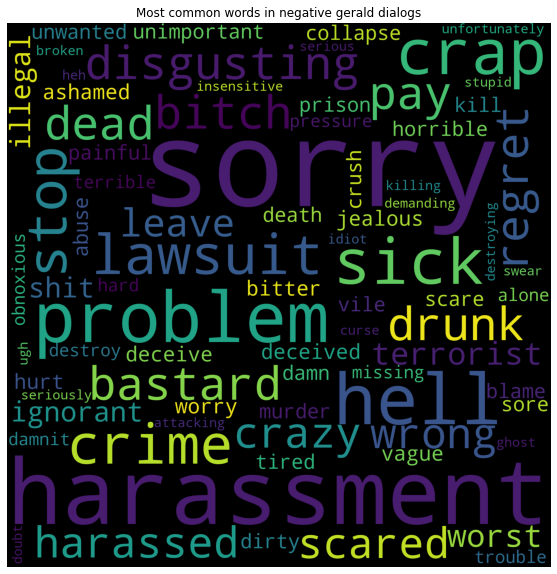

In [ ]:
plot_word_cloud(southpark_df.copy(), 'gerald', 'negative')

### Shelia

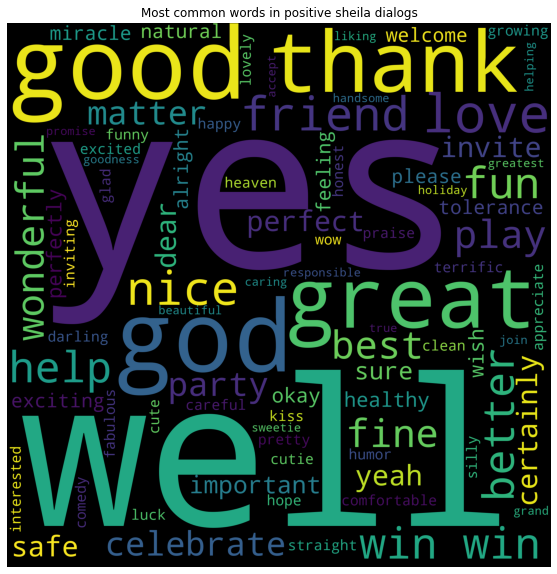

In [ ]:
plot_word_cloud(southpark_df.copy(), 'sheila', 'positive')

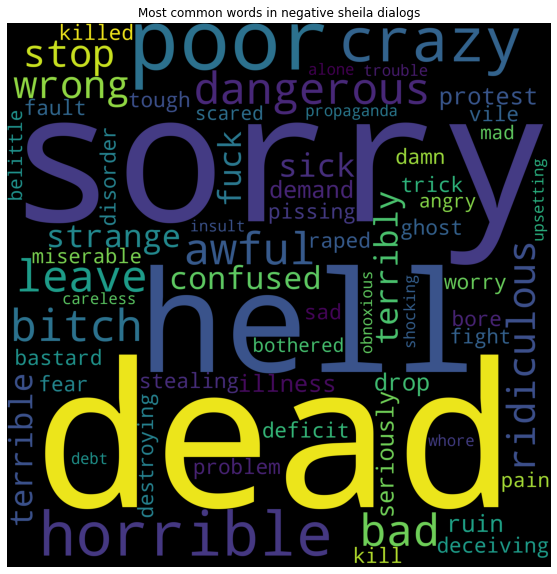

In [ ]:
plot_word_cloud(southpark_df.copy(), 'sheila', 'negative')

## Conclusion

### As we can see from the sentiment dialogs plots in every series, female characters are often flat in their sentiment behavior. In contrast, male characters are more friendly like Cleveland in Family Guy or more harmful such as the testicle monster from Rick & Morty.

# Word embeddings

## In this section, we will visualize the word embeddings representation trained on the dialogues in each series. We hypothesize that some words will have a  bias in their representation.

## Section author: @Ido

In [ ]:
def get_embedding_model(df):
  """
    This function create embeddings on the dialogs for a given series, train a Word2Vec from scratch
    :param df: series dataframe
    :return: dialogs embedding 
  """
  dialogs = [[WordNetLemmatizer().lemmatize(word) for word in word_tokenize(dialog) if word not in STOP_WORDS and word.isalpha()] for dialog in df['dialog'].values.tolist()]
  google_wv = gensim.models.KeyedVectors.load_word2vec_format('./models/GoogleNews-vectors-negative300.bin', binary=True)
  model = Word2Vec(size=300, min_count=5, iter=10)
  model.build_vocab(dialogs)
  training_examples_count = model.corpus_count
  model.build_vocab([list(google_wv.vocab.keys())], update=True)
  model.intersect_word2vec_format('./models/GoogleNews-vectors-negative300.bin', binary=True, lockf=1.0)
  model.train(dialogs, total_examples=training_examples_count, epochs=model.iter)
  return model

In [ ]:
def get_total_embedding_model(df):
  """
    This function create embeddings on the dialogs for a given series, train a trained Word2Vec model
    :param df: series dataframe
    :return: dialogs embedding 
  """
  dialogs = [[WordNetLemmatizer().lemmatize(word) for word in word_tokenize(dialog) if word not in STOP_WORDS and word.isalpha()] for dialog in df['dialog'].values.tolist()]
  google_wv = gensim.models.KeyedVectors.load_word2vec_format('./models/GoogleNews-vectors-negative300.bin', binary=True)
  model = Word2Vec(size=300, min_count=1, iter=10)
  model.build_vocab([list(google_wv.vocab.keys())])
  training_examples_count = model.corpus_count
  model.build_vocab(dialogs, update=True)
  model.intersect_word2vec_format('./models/GoogleNews-vectors-negative300.bin', binary=True, lockf=1.0)
  model.train(dialogs, total_examples=training_examples_count, epochs=model.iter)
  return model

In [ ]:
def visualize_word_similarity(model, word):
  """
    Plot embedding of a given word
    :param model: Word2Vec model
    :param word: word to plot
  """
  arr = np.empty((0,300), dtype='f')
  word_labels = [word]
  word_counts = [model.wv.vocab[word].count]
  close_words = model.wv.similar_by_word(word)

  arr = np.append(arr, np.array([model.wv[word]]), axis=0)
  for wrd_score in close_words:
      wrd_vector = model.wv[wrd_score[0]]
      word_labels.append(wrd_score[0])
      word_counts.append(model.wv.vocab[wrd_score[0]].count)

      arr = np.append(arr, np.array([wrd_vector]), axis=0)
      
  tsne = TSNE(n_components=2, random_state=0)
  np.set_printoptions(suppress=True)
  emb = tsne.fit_transform(arr)
  embed_df = pd.DataFrame({'tsne_1': emb[:, 0], 'tsne_2': emb[:, 1], 'word': word_labels, 'count': word_counts})

  fig = px.scatter(embed_df, x='tsne_1', y='tsne_2', hover_name='word', text='word', size='count', color='word', size_max=45, 
                   template='plotly_white', title=f'Words similarity and frequency for word: {word}', 
                   color_continuous_scale=px.colors.sequential.Sunsetdark)
  fig.update_traces(marker=dict(line=dict(width=1, color='Gray')))
  fig.update_layout(autosize=False, width=700, height=500)
  fig.show()

## Simpsons

In [ ]:
simpsons_emb_model = get_embedding_model(simpsons_df.copy())

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).
  if __name__ == '__main__':


In [ ]:
visualize_word_similarity(simpsons_emb_model, 'he')

In [ ]:
visualize_word_similarity(simpsons_emb_model, 'she')

In [ ]:
visualize_word_similarity(simpsons_emb_model, 'boy')

In [ ]:
visualize_word_similarity(simpsons_emb_model, 'girl')

In [ ]:
visualize_word_similarity(simpsons_emb_model, 'jewish')

In [ ]:
visualize_word_similarity(simpsons_emb_model, 'indian')

In [ ]:
visualize_word_similarity(simpsons_emb_model, 'black')

In [ ]:
visualize_word_similarity(simpsons_emb_model, 'white')

In [ ]:
del(simpsons_emb_model)

## Family guy

In [ ]:
family_guy_emb_model = get_total_embedding_model(family_guy_df.copy())

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning:

Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).



In [ ]:
visualize_word_similarity(family_guy_emb_model, 'he')

In [ ]:
visualize_word_similarity(family_guy_emb_model, 'she')

In [ ]:
visualize_word_similarity(family_guy_emb_model, 'boy')

In [ ]:
visualize_word_similarity(family_guy_emb_model, 'girl')

In [ ]:
visualize_word_similarity(family_guy_emb_model, 'jew')

In [ ]:
visualize_word_similarity(family_guy_emb_model, 'indian')

In [ ]:
visualize_word_similarity(family_guy_emb_model, 'black')

In [ ]:
visualize_word_similarity(family_guy_emb_model, 'white')

In [ ]:
del(family_guy_emb_model)

## Rick & Morty

In [ ]:
rickmorty_emb_model = get_total_embedding_model(rickmorty_df.copy())

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).
  if __name__ == '__main__':


In [ ]:
visualize_word_similarity(rickmorty_emb_model, 'he')

In [ ]:
visualize_word_similarity(rickmorty_emb_model, 'she')

In [ ]:
visualize_word_similarity(rickmorty_emb_model, 'boy')

In [ ]:
visualize_word_similarity(rickmorty_emb_model, 'girl')

In [ ]:
visualize_word_similarity(rickmorty_emb_model, 'jewish')

In [ ]:
visualize_word_similarity(rickmorty_emb_model, 'indian')

In [ ]:
visualize_word_similarity(rickmorty_emb_model, 'black')

In [ ]:
visualize_word_similarity(rickmorty_emb_model, 'white')

In [ ]:
del(rickmorty_emb_model)

## South Park

In [ ]:
southpark_emb_model = get_embedding_model(southpark_df.copy())

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning:

Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).



In [ ]:
visualize_word_similarity(southpark_emb_model, 'he')

In [ ]:
visualize_word_similarity(southpark_emb_model, 'she')

In [ ]:
visualize_word_similarity(southpark_emb_model, 'boy')

In [ ]:
visualize_word_similarity(southpark_emb_model, 'girl')

In [ ]:
visualize_word_similarity(southpark_emb_model, 'jewish')

In [ ]:
visualize_word_similarity(southpark_emb_model, 'indian')

In [ ]:
visualize_word_similarity(southpark_emb_model, 'black')

In [ ]:
visualize_word_similarity(southpark_emb_model, 'white')

In [ ]:
del(southpark_emb_model)

## Conclusion

### As we can see there are many obserbesions on word biases.
### For example, the word black in South Park close to the word minority.
### Girl in Simpons close to blonde and cutie.



# Gender dialog classification

## In this section, we will create a gender dialog classifier and visulaze print which kind of dialogs is more gender related and which of the dialogs the model confused. 

## Section author: @Shay

In [ ]:
def dialog2vector(model, dialog):
  """
    This function create from each dialog a vector given a Word2Vec model and a dialog
    :param model: Word2Vec model
    :param dialog: dialog to convert to a vector
    :return: vector representation of the dialog
  """
  words = word_tokenize(dialog)
  words = [w for w in words if w in model.wv]
  if len(words) != 0:
      return np.mean([model.wv[w] for w in words], axis=0)
  return None

In [ ]:
def build_gender_dialog_classifier(df):
  """
    This function create gender dialog classifier given a series dataframe
    :param df: series dataframe
    :return: trained boosted trees text-gender classifier
  """
  dialogs = [[WordNetLemmatizer().lemmatize(word) for word in word_tokenize(dialog) if word not in STOP_WORDS and word.isalpha()] for dialog in df['dialog'].values.tolist()]
  
  google_wv = gensim.models.KeyedVectors.load_word2vec_format('./models/GoogleNews-vectors-negative300.bin', binary=True)
  model = Word2Vec(size=300, min_count=5, iter=10)
  model.build_vocab(dialogs)
  training_examples_count = model.corpus_count
  model.build_vocab([list(google_wv.vocab.keys())], update=True)
  model.intersect_word2vec_format('./models/GoogleNews-vectors-negative300.bin', binary=True, lockf=1.0)
  model.train(dialogs, total_examples=training_examples_count, epochs=model.iter)
  
  sf = tc.SFrame(data=df[['dialog', 'gender']])
  sf = sf.dropna()
  sf['dialog_vector'] = sf['dialog'].apply(lambda d: dialog2vector(model, d))

  X_train, X_test, y_train, y_test = train_test_split(sf['dialog_vector'].to_numpy(), sf['gender'].to_numpy(), test_size=0.2, random_state=42, stratify=sf['gender'].to_numpy())
  X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.4, random_state=42, stratify=y_train)

  train = tc.SFrame(data={'dialog_vector': X_train, 'gender': y_train})
  validation = tc.SFrame(data={'dialog_vector': X_val, 'gender': y_val})
  test = tc.SFrame(data={'dialog_vector': X_test, 'gender': y_test})

  cls = tc.boosted_trees_classifier.create(dataset=train, features=['dialog_vector'], target="gender", validation_set=validation, max_depth=2, max_iterations=100, verbose=False)
  results_test = cls.evaluate(test)
  results_train = cls.evaluate(train)
  print('train')
  print(results_train)
  print('test')
  print(results_test)

  plt.plot(results_train['roc_curve']['fpr'], results_train['roc_curve']['tpr'], label='ROC Curve train (AUC = %0.5f)' %results_train['auc'])
  plt.plot(results_test['roc_curve']['fpr'], results_test['roc_curve']['tpr'], label='ROC Curve test (AUC = %0.5f)' %results_test['auc'])

  plt.xlim([-0.02, 1.0])
  plt.ylim([0., 1.02])
  plt.xlabel('FPR')
  plt.ylabel('TPR')
  plt.title('ROC curve')
  plt.legend()
  plt.show()
  
  return sf, cls

In [ ]:
def print_gender_dialog(sf, gender_indexes):
  """
    This function print relevant gender dialog
    :param sf:  series sframe
    :param gender_indexes: gender sframe indexes
  """
  print_count = 0
  for i in gender_indexes:
    if len(word_tokenize(sf['dialog'][i])) > 5:
      print(sf['dialog'][i])
      print_count += 1
    
    if print_count == 5:
      return

In [ ]:
def print_gender_classifier_dialog_results(sf, cls):
  """
    This function print the gender classifier dialog results
    :param sf: series sframe
    :param cls:  trained boosted trees text-gender classifier
  """
  pred = cls.predict(sf)  
  y_true = sf['gender']

  male_male = [i for i in range(len(pred)) if pred[i] == y_true[i] and pred[i] == 'm']
  male_female = [i for i in range(len(pred)) if pred[i] != y_true[i] and pred[i] == 'm']
  female_male = [i for i in range(len(pred)) if pred[i] != y_true[i] and pred[i] == 'f']
  female_female = [i for i in range(len(pred)) if pred[i] == y_true[i] and pred[i] == 'f']

  print('Dialog that said by a man and the model predict as a man:')
  print_gender_dialog(sf, male_male)
  print()
  print('Dialog that said by a man and the model predict as a woman:')
  print_gender_dialog(sf, female_male)
  print()
  print('Dialog that said by a woman and the model predict as a man:')
  print_gender_dialog(sf, male_female)
  print()
  print('Dialog that said by a woman and the model predict as a woman:')
  print_gender_dialog(sf, female_female)

## Simpsons

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning:

Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



train
{'accuracy': 0.7543654628401915, 'auc': 0.7099673982950294, 'confusion_matrix': Columns:
	target_label	str
	predicted_label	str
	count	int

Rows: 4

Data:
+--------------+-----------------+-------+
| target_label | predicted_label | count |
+--------------+-----------------+-------+
|      m       |        f        |  476  |
|      f       |        f        |  1088 |
|      f       |        m        | 10454 |
|      m       |        m        | 32479 |
+--------------+-----------------+-------+
[4 rows x 3 columns]
, 'f1_score': 0.8559719586759434, 'log_loss': 0.5202352952298808, 'precision': 0.7565043206857196, 'recall': 0.9855560612957063, 'roc_curve': Columns:
	threshold	float
	fpr	float
	tpr	float
	p	int
	n	int

Rows: 1001

Data:
+-----------+-----+-----+-------+-------+
| threshold | fpr | tpr |   p   |   n   |
+-----------+-----+-----+-------+-------+
|    0.0    | 1.0 | 1.0 | 32955 | 11542 |
|   0.001   | 1.0 | 1.0 | 32955 | 11542 |
|   0.002   | 1.0 | 1.0 | 32955 | 11542 |

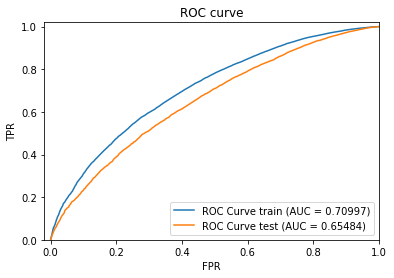

In [ ]:
simpsons_gender_sf, simpsons_gender_cls = build_gender_dialog_classifier(simpsons_df.copy())

In [ ]:
print_gender_classifier_dialog_results(simpsons_gender_sf, simpsons_gender_cls)

Dialog that said by a man and the model predict as a man:
hee hee i win in your face yeah how do you like them apples woo hoo hoo
no now look son we all know that usually when you bug me like this i give in so im not mad at you for trying it shows youve been paying attention but we all know im not gonna give you a hundred dollars now are you gonna stop bugging me
i guess we can overlook this
weell seeing as how its a first offense
say writing all those tickets must make you guys thirsty how about a couple on the house

Dialog that said by a man and the model predict as a woman:
aw mom i couldnt ask you to do that youre already taking care of maggie and lisa is such a handful 
bart what are you staring at
youre going crazy bart im telling your mom
come on homer what are her faults
did your mom really write that shopping list

Dialog that said by a woman and the model predict as a man:
no actually it was a little of both sometimes when a disease is in all the magazines and all the news s

## Family guy

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning:

Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



train
{'accuracy': 0.9559939301972686, 'auc': 0.9871654234313303, 'confusion_matrix': Columns:
	target_label	str
	predicted_label	str
	count	int

Rows: 4

Data:
+--------------+-----------------+-------+
| target_label | predicted_label | count |
+--------------+-----------------+-------+
|      m       |        f        |   2   |
|      f       |        f        |  102  |
|      f       |        m        |   27  |
|      m       |        m        |  528  |
+--------------+-----------------+-------+
[4 rows x 3 columns]
, 'f1_score': 0.9732718894009217, 'log_loss': 0.13686869425850123, 'precision': 0.9513513513513514, 'recall': 0.9962264150943396, 'roc_curve': Columns:
	threshold	float
	fpr	float
	tpr	float
	p	int
	n	int

Rows: 1001

Data:
+-----------+-----+-----+-----+-----+
| threshold | fpr | tpr |  p  |  n  |
+-----------+-----+-----+-----+-----+
|    0.0    | 1.0 | 1.0 | 530 | 129 |
|   0.001   | 1.0 | 1.0 | 530 | 129 |
|   0.002   | 1.0 | 1.0 | 530 | 129 |
|   0.003   | 1.0 | 1.

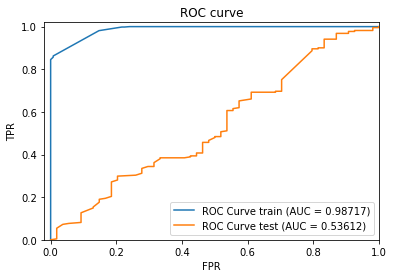

In [ ]:
family_guy_gender_sf, family_guy_gender_cls = build_gender_dialog_classifier(family_guy_df.copy())

In [ ]:
print_gender_classifier_dialog_results(family_guy_gender_sf, family_guy_gender_cls)

Dialog that said by a man and the model predict as a man:
 damn you vile woman youve impeded my work since the day i escaped from your wretched womb
 i cant even watch tv anymore all the shows are starting to run together
 gosh id like to help you peter but uh ive gotta go out in the hall and chew on the back of my ass for about five minutes
 look chris its a whole family of wasps
 canada sucks peter has a flashback of when he was on jeopardy

Dialog that said by a man and the model predict as a woman:
 i didnt say that lee majors did
 after carol has given birth oh my god
 uhhhh its exactly what it looks like
 how do you think it works
 nothing there was its like if you forget it its nothing meg

Dialog that said by a woman and the model predict as a man:
 chris thats a terrible word sarcastically nipple ill chalk that up to the heat mister
 careful i just cleaned the floor
 oh youre just teething stewie its a normal part of a babys life
 oh you just want your toy back ok here you go 

## Rick & Morty

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning:

Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



train
{'accuracy': 0.9649890590809628, 'auc': 0.9909638086362235, 'confusion_matrix': Columns:
	target_label	str
	predicted_label	str
	count	int

Rows: 4

Data:
+--------------+-----------------+-------+
| target_label | predicted_label | count |
+--------------+-----------------+-------+
|      f       |        f        |  144  |
|      f       |        m        |   30  |
|      m       |        m        |  738  |
|      m       |        f        |   2   |
+--------------+-----------------+-------+
[4 rows x 3 columns]
, 'f1_score': 0.9787798408488064, 'log_loss': 0.13513036817036403, 'precision': 0.9609375, 'recall': 0.9972972972972973, 'roc_curve': Columns:
	threshold	float
	fpr	float
	tpr	float
	p	int
	n	int

Rows: 1001

Data:
+-----------+-----+-----+-----+-----+
| threshold | fpr | tpr |  p  |  n  |
+-----------+-----+-----+-----+-----+
|    0.0    | 1.0 | 1.0 | 740 | 174 |
|   0.001   | 1.0 | 1.0 | 740 | 174 |
|   0.002   | 1.0 | 1.0 | 740 | 174 |
|   0.003   | 1.0 | 1.0 | 740 |

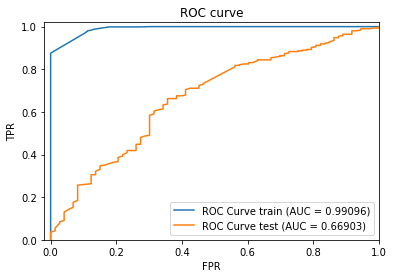

In [ ]:
rickmorty_gender_sf, rickmorty_gender_cls = build_gender_dialog_classifier(rickmorty_df.copy())

In [ ]:
print_gender_classifier_dialog_results(rickmorty_gender_sf, rickmorty_gender_cls)

Dialog that said by a man and the model predict as a man:
morty you gotta come on jus you gotta come with me
where are my testicles summer  where are my testicles summer they were removed where have they gone
holy crap morty he can travel through dreams he can travel through dreams were so screwed
nothing but fear from here on out bitch
oh geez rick wwwhoa this isnt good

Dialog that said by a man and the model predict as a woman:
welcome to your nightmare bitch raaaaawwwrrr
i dont want to talk about it
you will walk when it is time to walk
i should get her pregnant then shell have to marry me
bring the boy to me you were always kind to me morty thats why i will leave you with your testicles from now on you will be my best friend and live by my side

Dialog that said by a woman and the model predict as a man:
aw oh my god he recognizes the other dogs on tv
i dont know its indian giving
humans understand snuffles now that is awesome
oh i think youve had enough sir
hes saying i love obam

## South Park

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning:

Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



train
{'accuracy': 0.9152746425884123, 'auc': 0.8426686300077293, 'confusion_matrix': Columns:
	target_label	str
	predicted_label	str
	count	int

Rows: 4

Data:
+--------------+-----------------+-------+
| target_label | predicted_label | count |
+--------------+-----------------+-------+
|      m       |        f        |   25  |
|      f       |        f        |  113  |
|      f       |        m        |  1664 |
|      m       |        m        | 18133 |
+--------------+-----------------+-------+
[4 rows x 3 columns]
, 'f1_score': 0.9554999341325255, 'log_loss': 0.2339226471851196, 'precision': 0.9159468606354498, 'recall': 0.9986231963872674, 'roc_curve': Columns:
	threshold	float
	fpr	float
	tpr	float
	p	int
	n	int

Rows: 1001

Data:
+-----------+-----+-----+-------+------+
| threshold | fpr | tpr |   p   |  n   |
+-----------+-----+-----+-------+------+
|    0.0    | 1.0 | 1.0 | 18158 | 1777 |
|   0.001   | 1.0 | 1.0 | 18158 | 1777 |
|   0.002   | 1.0 | 1.0 | 18158 | 1777 |
|   0

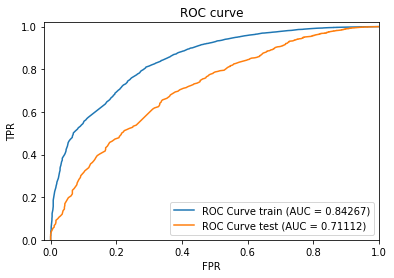

In [ ]:
southpark_gender_sf, southpark_gender_cls = build_gender_dialog_classifier(southpark_df.copy())

In [ ]:
print_gender_classifier_dialog_results(southpark_gender_sf, southpark_gender_cls)

Dialog that said by a man and the model predict as a man:
get around th side there ned i cant get a shot in from here
it is sick and disgusting and we simply will not have it
sheila let me handle this  having imaginary friends is fine kyle but this simply will not do
now i want you to repeat after me there is no such thing as mr hankey
theres no such thing as mr hankey

Dialog that said by a man and the model predict as a woman:
eric keep quiet im trying to sleep
it is too late for me young wendy
stanley are you passing notes to kyle
pooinshower madalen shine debaur huelar she mashartah me shur har
dont you oh brother me shes the woman of my dreams

Dialog that said by a woman and the model predict as a man:
this is for your own good bubbe
that isnt all mayor  the school play is doing a nativity scene  it isnt being sensitive to the jewish community
okay kyle were leaving right nowww
you want some more cheesy poofs hon
now that does it im going straight to the mayor about you mr garris

## Conclusion

### As we can see there are some lines that are more genedr-related:

### Male dominate lines:
### * say writing all those tickets must make you guys thirsty how about a couple on the house
### *  i cant even watch tv anymore all the shows are starting to run together


### Female dominate lines:
### * oh my the house looks wonderful grampa whats your secret
### * oh honey i know youre hurting but mommy has to clean up the house all right

### Female that seems like male lines:
### * so maybe a parttime job is the answer
### * oh my god you can only play the piano when youre drunk

### Male that seems like female lines:
### * did your mom really write that shopping list
### *  uhhhh its exactly what it looks like


### We can see that male related lines are more in the subjects of beer and watching tv, while female related lines are more in the subjects of cleaning or shopping.

# Topic modeling on dialog per gender

### In this section, we will create a gender topic model classifier and the diffrent top 5 subjects in each gender dialog related.
Section author: @Shay


In [ ]:
def get_topics_from_dialog(dialogs):
  """
    This function returns the topic out of a given dialogs
    :param dialogs: dialogs extract topic from
    :return: top 5 topics
  """
  nlp = spacy.load("en")

  # Updates spaCy's default stop words list with my additional words. 
  nlp.Defaults.stop_words.update(STOP_WORDS)

  # Iterates over the words in the stop words list and resets the "is_stop" flag.
  for word in STOP_WORDS:
      lexeme = nlp.vocab[word]
      lexeme.is_stop = True
      
  def remove_stopwords(doc):
      # This will remove stopwords and punctuation.
      # Use token.text to return strings, which we'll need for Gensim.
      doc = [token.text for token in doc if token.is_stop != True and token.is_punct != True]
      return doc

  # The add_pipe function appends our functions to the default pipeline.
  nlp.add_pipe(remove_stopwords, name="stopwords", last=True)

  doc_list = []
  # Iterates through each article in the corpus.
  for doc in tqdm(dialogs):
      # Passes that article through the pipeline and adds to a new list.
      pr = nlp(doc)
      doc_list.append(pr)
  
  # Creates, which is a mapping of word IDs to words.
  words = corpora.Dictionary(doc_list)

  # Turns each document into a bag of words.
  corpus = [words.doc2bow(doc) for doc in doc_list]

  lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=words, num_topics=5, random_state=2, update_every=1, passes=10, alpha='auto', per_word_topics=True)

  pprint(lda_model.print_topics(num_topics=5, num_words=20))

In [ ]:
def get_gender_dialogs(df, gender):
  return df[df['gender'] == gender].dialog

## Simpsons

In [ ]:
simpsons_male_dialogs, simpsons_female_dialogs = get_gender_dialogs(simpsons_df.copy(), 'm'), get_gender_dialogs(simpsons_df.copy(), 'f')

In [ ]:
print('Simpsons male dialogs top 5 topics:')
get_topics_from_dialog(simpsons_male_dialogs)

Simpsons male dialogs top 5 topics:


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`




[(0,
  '0.031*"right" + 0.017*"yes" + 0.016*"lets" + 0.011*"maybe" + 0.010*"guys" + '
  '0.009*"things" + 0.008*"guess" + 0.008*"use" + 0.007*"huh" + 0.007*"real" + '
  '0.007*"book" + 0.007*"whoa" + 0.006*"leave" + 0.005*"game" + '
  '0.005*"children" + 0.005*"hard" + 0.004*"food" + 0.004*"ow" + '
  '0.004*"course" + 0.004*"phone"'),
 (1,
  '0.070*" " + 0.013*"better" + 0.007*"friends" + 0.007*"fine" + 0.007*"talk" '
  '+ 0.006*"play" + 0.006*"car" + 0.005*"father" + 0.005*"listen" + '
  '0.005*"hello" + 0.005*"woo" + 0.005*"hoo" + 0.005*"deal" + 0.005*"comes" + '
  '0.005*"head" + 0.004*"makes" + 0.004*"told" + 0.004*"welcome" + '
  '0.004*"dead" + 0.004*"problem"'),
 (2,
  '0.038*"hey" + 0.021*"okay" + 0.016*"dad" + 0.012*"wait" + 0.011*"said" + '
  '0.010*"mom" + 0.009*"stop" + 0.008*"stupid" + 0.007*"years" + 0.007*"cool" '
  '+ 0.007*"kill" + 0.006*"eh" + 0.006*"room" + 0.006*"party" + 0.005*"ooh" + '
  '0.005*"krusty" + 0.005*"movie" + 0.005*"start" + 0.005*"cmon" + '
  '0.005*

In [ ]:
print('Simpsons female dialogs top 5 topics:')
get_topics_from_dialog(simpsons_female_dialogs)

Simpsons female dialogs top 5 topics:


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`




[(0,
  '0.088*"nt" + 0.030*"bart" + 0.028*"know" + 0.024*"like" + 0.020*"homie" + '
  '0.018*"lisa" + 0.015*"mom" + 0.015*"gon" + 0.012*"okay" + 0.012*"friends" + '
  '0.011*"right" + 0.010*"family" + 0.010*"life" + 0.009*"sold" + '
  '0.009*"going" + 0.009*"sorry" + 0.009*"home" + 0.009*"thing" + 0.009*"play" '
  '+ 0.008*"tell"'),
 (1,
  '0.042*"oh" + 0.020*"good" + 0.019*"friend" + 0.018*"think" + 0.017*"got" + '
  '0.014*"look" + 0.012*"little" + 0.012*"fine" + 0.012*"sure" + 0.012*"way" + '
  '0.011*"help" + 0.010*"better" + 0.010*"new" + 0.010*"couple" + 0.010*"love" '
  '+ 0.010*"time" + 0.009*"people" + 0.009*"nerd" + 0.008*"day" + '
  '0.007*"trying"'),
 (2,
  '0.051*"homer" + 0.018*"barts" + 0.012*"car" + 0.011*"seen" + 0.011*"pretty" '
  '+ 0.011*"bed" + 0.010*"watch" + 0.009*"shut" + 0.008*"feeling" + '
  '0.008*"changed" + 0.008*"lenny" + 0.008*"thinks" + 0.008*"awful" + '
  '0.008*"entire" + 0.008*"double" + 0.008*"glasses" + 0.008*"wave" + '
  '0.007*"strike" + 0.007*"a

## Family guy

In [ ]:
family_guy_male_dialogs, family_guy_female_dialogs = get_gender_dialogs(family_guy_df.copy(), 'm'), get_gender_dialogs(family_guy_df.copy(), 'f')

In [ ]:
print('Family guy male dialogs top 5 topics:')
get_topics_from_dialog(family_guy_male_dialogs)

Family guy male dialogs top 5 topics:


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`




[(0,
  '0.089*" " + 0.063*"\xa0" + 0.014*"like" + 0.012*"gon" + 0.012*"oh" + '
  '0.012*"nt" + 0.007*"yeah" + 0.007*"shut" + 0.005*"hey" + 0.005*"love" + '
  '0.005*"cleveland" + 0.004*"thanks" + 0.004*"wow" + 0.004*"mean" + '
  '0.004*"guys" + 0.004*"lois" + 0.004*"looks" + 0.004*"old" + 0.004*"new" + '
  '0.004*"voice"'),
 (1,
  '0.124*"\xa0" + 0.066*" " + 0.013*"oh" + 0.012*"know" + 0.011*"nt" + '
  '0.007*"laughs" + 0.007*"think" + 0.007*"lois" + 0.006*"hey" + 0.006*"god" + '
  '0.005*"uh" + 0.005*"right" + 0.005*"got" + 0.005*"damn" + 0.005*"people" + '
  '0.005*"yeah" + 0.004*"like" + 0.004*"drunk" + 0.004*"whoa" + 0.003*"real"'),
 (2,
  '0.143*" " + 0.027*"\xa0" + 0.012*"nt" + 0.011*"yes" + 0.010*"brian" + '
  '0.009*"know" + 0.007*"hell" + 0.007*"like" + 0.005*"stewie" + 0.005*"sure" '
  '+ 0.004*"snake" + 0.004*"good" + 0.004*"ungabunga" + 0.004*"ah" + '
  '0.004*"says" + 0.004*"little" + 0.004*"thing" + 0.004*"read" + '
  '0.003*"going" + 0.003*"right"'),
 (3,
  '0.107*" " +

In [ ]:
print('Family guy female dialogs top 5 topics:')
get_topics_from_dialog(family_guy_female_dialogs)

Family guy female dialogs top 5 topics:


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`




[(0,
  '0.083*"\xa0" + 0.066*" " + 0.023*"look" + 0.015*"chris" + 0.010*"honey" + '
  '0.010*"oh" + 0.008*"house" + 0.007*"brian" + 0.007*"nt" + 0.007*"guess" + '
  '0.007*"joke" + 0.007*"underwear" + 0.007*"makes" + 0.007*"distinguished" + '
  '0.007*"little" + 0.007*"fine" + 0.007*"hi" + 0.007*"living" + 0.007*"room" '
  '+ 0.007*"ow"'),
 (1,
  '0.112*" " + 0.041*"nt" + 0.039*"\xa0" + 0.027*"think" + 0.019*"oh" + '
  '0.012*"like" + 0.010*"know" + 0.010*"god" + 0.010*"got" + 0.008*"job" + '
  '0.008*"stewie" + 0.008*"gon" + 0.008*"brian" + 0.006*"whoevers" + '
  '0.006*"story" + 0.006*"college" + 0.006*"room" + 0.006*"maybe" + '
  '0.006*"lets" + 0.005*"let"'),
 (2,
  '0.121*" " + 0.037*"oh" + 0.030*"\xa0" + 0.022*"nt" + 0.020*"good" + '
  '0.015*"yes" + 0.010*"boy" + 0.010*"know" + 0.010*"beautiful" + '
  '0.010*"chris" + 0.008*"hell" + 0.008*"size" + 0.008*"sure" + 0.008*"going" '
  '+ 0.008*"girl" + 0.008*"think" + 0.008*"sister" + 0.005*"read" + '
  '0.005*"live" + 0.005*"hate"'

## Rick & Morty

In [ ]:
rickmorty_male_dialogs, rickmorty_female_dialogs = get_gender_dialogs(rickmorty_df.copy(), 'm'), get_gender_dialogs(rickmorty_df.copy(), 'f')

In [ ]:
print('Rick & Morty male dialogs top 5 topics:')
get_topics_from_dialog(rickmorty_male_dialogs)

Rick & Morty male dialogs top 5 topics:


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`




[(0,
  '0.037*"oh" + 0.037*"nt" + 0.018*"know" + 0.012*"yeah" + 0.010*"rick" + '
  '0.010*"like" + 0.010*" " + 0.010*"think" + 0.008*"gon" + 0.008*"god" + '
  '0.008*"guys" + 0.007*"time" + 0.007*"mean" + 0.006*"love" + 0.005*"huh" + '
  '0.005*"morty" + 0.005*"geez" + 0.004*"yes" + 0.004*"way" + 0.004*"okay"'),
 (1,
  '0.037*"nt" + 0.024*"morty" + 0.016*"time" + 0.015*"know" + 0.011*" " + '
  '0.009*"uh" + 0.009*"going" + 0.006*"gon" + 0.005*"holy" + 0.005*"crap" + '
  '0.005*"yeah" + 0.005*"pickle" + 0.005*"summer" + 0.004*"fine" + '
  '0.004*"bitch" + 0.004*"mean" + 0.004*"got" + 0.004*"understand" + '
  '0.004*"thank" + 0.004*"guys"'),
 (2,
  '0.018*" " + 0.015*"know" + 0.013*"like" + 0.013*"right" + 0.009*"nt" + '
  '0.008*"morty" + 0.008*"rick" + 0.008*"mortys" + 0.007*"okay" + 0.007*"hey" '
  '+ 0.006*"ricks" + 0.006*"think" + 0.006*"got" + 0.005*"wow" + 0.005*"geez" '
  '+ 0.005*"mr" + 0.004*"people" + 0.004*"aw" + 0.004*"gon" + 0.004*"ah"'),
 (3,
  '0.037*"rick" + 0.025*"mort

In [ ]:
print('Rick & Morty female dialogs top 5 topics:')
get_topics_from_dialog(rickmorty_female_dialogs)

Rick & Morty female dialogs top 5 topics:


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`




[(0,
  '0.045*"nt" + 0.024*" " + 0.011*"work" + 0.011*"stop" + 0.011*"leave" + '
  '0.010*"love" + 0.010*"right" + 0.010*"know" + 0.010*"like" + 0.009*"yes" + '
  '0.009*"people" + 0.008*"jerry" + 0.007*"horse" + 0.007*"surgeon" + '
  '0.007*"mind" + 0.007*"think" + 0.006*"going" + 0.006*"better" + '
  '0.006*"home" + 0.006*"deer"'),
 (1,
  '0.019*"summer" + 0.017*"know" + 0.017*"time" + 0.015*"okay" + 0.013*"morty" '
  '+ 0.013*"way" + 0.012*"nt" + 0.011*"rick" + 0.009*"kids" + 0.009*"sorry" + '
  '0.007*"jerry" + 0.007*"little" + 0.007*"fine" + 0.007*"happening" + '
  '0.007*"fuck" + 0.007*"grampa" + 0.007*"prison" + 0.006*" " + 0.005*"pickle" '
  '+ 0.005*"kind"'),
 (2,
  '0.019*"jerry" + 0.017*"nt" + 0.014*"mean" + 0.014*"going" + 0.011*"grandpa" '
  '+ 0.010*"school" + 0.007*"okay" + 0.007*"life" + 0.007*"oh" + '
  '0.007*"family" + 0.006*"god" + 0.005*"holy" + 0.005*"bail" + '
  '0.005*"huffing" + 0.005*"dogs" + 0.005*"problems" + 0.005*"important" + '
  '0.005*"turn" + 0.005*"h

## South Park

In [ ]:
southpark_male_dialogs, southpark_female_dialogs = get_gender_dialogs(southpark_df.copy(), 'm'), get_gender_dialogs(southpark_df.copy(), 'f')

In [ ]:
print('South Park male dialogs top 5 topics:')
get_topics_from_dialog(southpark_male_dialogs)

South Park male dialogs top 5 topics:


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`




[(0,
  '0.058*"right" + 0.041*"hey" + 0.027*"going" + 0.023*"dad" + 0.016*"wait" + '
  '0.012*"cool" + 0.011*"play" + 0.009*"ike" + 0.008*"wrong" + 0.007*"sharon" '
  '+ 0.006*"whoa" + 0.006*"park" + 0.006*"wanted" + 0.006*"coming" + '
  '0.006*"change" + 0.005*"watching" + 0.005*"craig" + 0.005*"says" + '
  '0.005*"took" + 0.005*"finally"'),
 (1,
  '0.039*"okay" + 0.031*"uh" + 0.023*"need" + 0.018*"lets" + 0.016*"stop" + '
  '0.015*"alright" + 0.015*"school" + 0.013*"thing" + 0.010*"mr" + 0.010*"new" '
  '+ 0.010*"mkay" + 0.010*"kids" + 0.009*"talk" + 0.009*"token" + 0.009*"try" '
  '+ 0.009*" " + 0.008*"game" + 0.008*"real" + 0.008*"thanks" + 0.008*"wendy"'),
 (2,
  '0.069*"yeah" + 0.047*"guys" + 0.036*"\xa0" + 0.027*"stan" + 0.024*"\xa0\xa0'
  '" + 0.023*"good" + 0.015*"sure" + 0.014*"huh" + 0.013*"help" + '
  '0.011*"better" + 0.010*"ah" + 0.009*"guess" + 0.008*"pretty" + 0.008*"bad" '
  '+ 0.008*"actually" + 0.008*"nice" + 0.008*"idea" + 0.007*"company" + '
  '0.007*"fine" + 0.00

In [ ]:
print('South Park female dialogs top 5 topics:')
get_topics_from_dialog(southpark_female_dialogs)

South Park female dialogs top 5 topics:


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: TqdmDeprecationWarning:

This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`




[(0,
  '0.037*" " + 0.023*"know" + 0.019*"nt" + 0.014*"gon" + 0.012*"school" + '
  '0.012*"oh" + 0.011*"stanley" + 0.011*"wait" + 0.010*"hey" + 0.010*"like" + '
  '0.008*"guys" + 0.007*"look" + 0.007*"sorry" + 0.005*"little" + '
  '0.005*"stupid" + 0.005*"huh" + 0.005*"time" + 0.005*"today" + '
  '0.004*"minute" + 0.004*"got"'),
 (1,
  '0.049*"eric" + 0.030*" " + 0.020*"okay" + 0.016*"boys" + 0.015*"little" + '
  '0.012*"nt" + 0.010*"cartman" + 0.009*"right" + 0.009*"got" + 0.008*"think" '
  '+ 0.007*"good" + 0.006*"oh" + 0.006*"lets" + 0.006*"kids" + 0.006*"like" + '
  '0.006*"going" + 0.006*"need" + 0.005*"friends" + 0.005*"girls" + '
  '0.005*"stan"'),
 (2,
  '0.025*"mr" + 0.015*"stan" + 0.014*"garrison" + 0.012*"like" + 0.010*"sure" '
  '+ 0.008*"hi" + 0.008*"nt" + 0.007*"look" + 0.006*"egg" + 0.006*" " + '
  '0.006*"crap" + 0.006*"love" + 0.006*"\xa0\xa0" + 0.006*"sweetie" + '
  '0.005*"happy" + 0.005*"students" + 0.005*"park" + 0.005*"south" + '
  '0.005*"mackey" + 0.005*"yeah"'

## Conclusion

### As we can see there are gender related word in each topic for every series.
### For male related subject: game, food, car, beer, money.

### For female related subject: family, home, pie, house, love.